In [1]:
from catboost import Pool, cv
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier

In [2]:
df_train = pd.read_csv('../../data/important data/df_train_fs_together.csv')
df_test = pd.read_csv('../../data/important data/df_test_fs_together.csv')
df_test.set_index('id', inplace=True)

In [3]:
X = df_train.drop(columns=['price'], axis=1)
y = df_train['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [4]:
params = {
        'iterations': 2000,
        'depth': 7,
        'learning_rate': 0.02851039097814841,
        'l2_leaf_reg': 6.051611224927471,
        'verbose': False,
        'random_state': 42,
        'early_stopping_rounds': 50,
        'task_type': 'GPU',
        'devices': '0',
        'gpu_ram_part': 0.9,
        'max_ctr_complexity': 1,
        'loss_function': 'RMSE'
    }

In [6]:
cat_features = []

train_pool = Pool(data=X_train, label=y_train, cat_features=cat_features)

scores = cv(train_pool, params, fold_count=5, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

CatBoostError: catboost/cuda/cuda_lib/cuda_manager.cpp:201: Condition violated: `State == nullptr'

In [ ]:
model = CatBoostClassifier(loss_function="MultiClass", verbose=False)

grid = {
    'learning_rate': [0.03, 0.1],
    'depth': [4, 6, 10],
    'l2_leaf_reg': [1, 3, 5, 7, 9]
}

grid_search_result = model.grid_search(
    grid,
    X=X_train,
    y=y_train,
    plot=True  # 如果在支持的环境中运行，可以看到网格搜索过程的图表
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [39]:
data = df_train.drop(columns=['price'], axis=1).values  # 或者直接用 DataFrame
target = df_train['price'].values  # 目标变量

# 设置需要分析的特征名称或索引
feature = None  # 如果为 None，则分析所有特征。如果只分析某一列，传入列索引或名称，例如 'feature_name'

# 配置分类特征的取值
cat_feature_values = None  # 如果你有分类特征值的范围，可以提供列表，比如 [0, 1, 2]

# 是否生成可视化图表
plot = True
max_cat_features_on_plot = 10  # 可视化时最多显示的分类特征数量

# 设置线程数
thread_count = -1  # -1 表示使用所有可用线程

# 图表文件输出路径（如果需要保存图表）
plot_file = '../../report/image/catboost_calc.png'  # 比如 'feature_statistics_plot.png'
model = CatBoostClassifier(verbose=False)
model.fit(data, target)
# 调用 calc_feature_statistics
feature_statistics = model.calc_feature_statistics(
    data=data,
    target=target,
    feature=feature,
    prediction_type='Class',  # 如果是分类问题，填 'Class'; 回归问题留 None
    cat_feature_values=cat_feature_values,
    plot=plot,
    max_cat_features_on_plot=max_cat_features_on_plot,
    thread_count=thread_count,
    plot_file=plot_file
)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import catboost as cb
from catboost import monoforest

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

%matplotlib inline

SEED = 42

In [2]:
df_train = pd.read_csv('../../data/important data/df_train_processed.csv')
df_test = pd.read_csv('../../data/important data/df_test_processed.csv')
df_test.set_index('id', inplace=True)

In [3]:
df_train.drop(columns=['distance_to_nyc'], inplace=True)

In [15]:
X = df_train.drop(columns=['price'], axis=1)
y = df_train['price']

In [4]:
df_train.columns.to_list()

['host_response_rate',
 'host_acceptance_rate',
 'host_listings_count',
 'host_total_listings_count',
 'calculated_host_listings_count',
 'calculated_host_listings_count_entire_homes',
 'calculated_host_listings_count_private_rooms',
 'accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'availability_30',
 'availability_60',
 'availability_90',
 'availability_365',
 'minimum_nights',
 'maximum_nights',
 'number_of_reviews',
 'number_of_reviews_ltm',
 'number_of_reviews_l30d',
 'review_scores_rating',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_checkin',
 'review_scores_communication',
 'review_scores_location',
 'review_scores_value',
 'reviews_per_month',
 'host_since_day',
 'review_duration',
 'has_phone',
 'has_email',
 'has_work_email',
 'bathroom_count',
 'shared',
 'private',
 'property_type_Entire rental unit',
 'property_type_Private room in rental unit',
 'property_type_Room in hotel',
 'property_type_Private room in home',
 'property_type_Private 

In [5]:
# 设置目标变量和特征列
column_target = "price"  # 目标变量
column_score = "proba_price"  # 可用于预测概率的列名
columns_feature = [col for col in df_train.columns if col != column_target]  # 特征列

# 生成 DataFrame 格式的数据
df_data = df_train.reset_index(drop=True)

# 划分训练集和测试集
SEED = 42
df_train, df_test = train_test_split(
    df_data, test_size=0.3, random_state=SEED
)

df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

# 创建 CatBoost 的数据池
pool_train = cb.Pool(
    data=df_train[columns_feature],
    label=df_train[column_target],
    feature_names=columns_feature
)

pool_test = cb.Pool(
    data=df_test[columns_feature],
    label=df_test[column_target],
    feature_names=columns_feature
)

# 检查结果
print(f"Training pool:\n{pool_train}")
print(f"Testing pool:\n{pool_test}")

Training pool:
Testing pool:


In [14]:
kwargs = {'random_state': SEED, 'depth': 11, 'learning_rate': 0.011673097301115248, 'l2_leaf_reg': 3.9610462134782107, 'border_count': 198, 'bagging_temperature': 0.4629530570444912, 'random_strength': 0.8567728807906595, 'devices': '0', 'task_type': 'GPU', 'loss_function': 'MultiClass'}

cat = cb.CatBoostClassifier(
    **kwargs
)
cat.fit(pool_train, verbose=0, plot=True)
# 
# df_train[column_score] = cat.predict_proba(df_train[columns_feature])[:, 1]
# df_test[column_score] = cat.predict_proba(df_test[columns_feature])[:, 1]

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

<Axes: title={'center': 'Top 50 PredictionValuesChange'}, ylabel='Feature Id'>

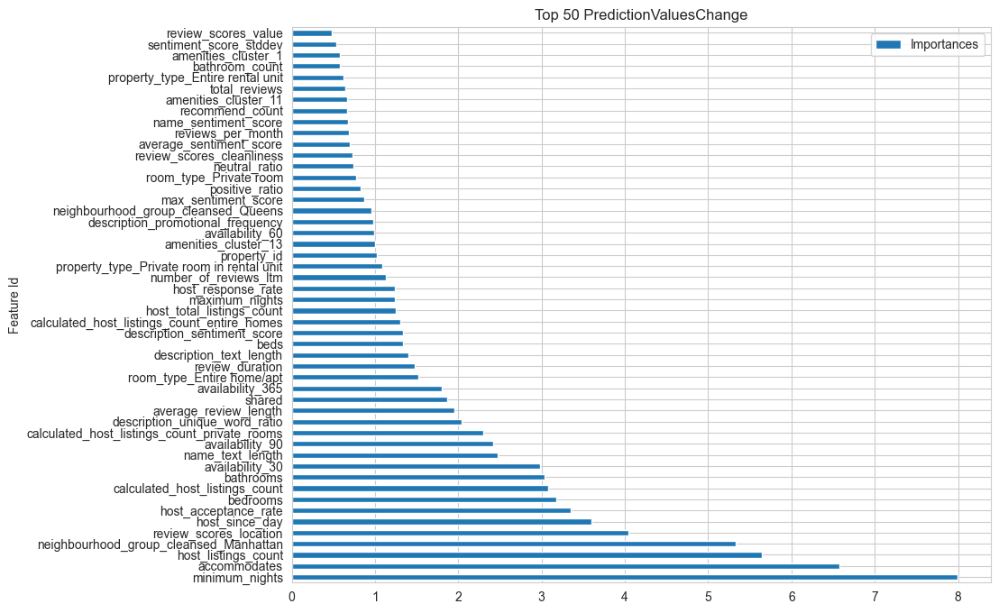

In [7]:
type_feature_importance = "PredictionValuesChange"
top_n = 50  # 显示最重要的前20个变量
feature_importance = cat.get_feature_importance(
    data=pool_train,
    type=type_feature_importance,
    prettified=True
).sort_values("Importances", ascending=False)

feature_importance.head(top_n).set_index("Feature Id").plot.barh(
    figsize=(10, 8), grid=True, title=f"Top {top_n} {type_feature_importance}"
)


In [18]:
# feature = 'beds'
# res = cat.calc_feature_statistics(X, y, feature, plot=True)
res = cat.calc_feature_statistics(X, y, plot=True)

C:\Users\22451\.conda\envs\pytorch\Lib\site-packages\catboost\monoforest.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, plots_per_row)


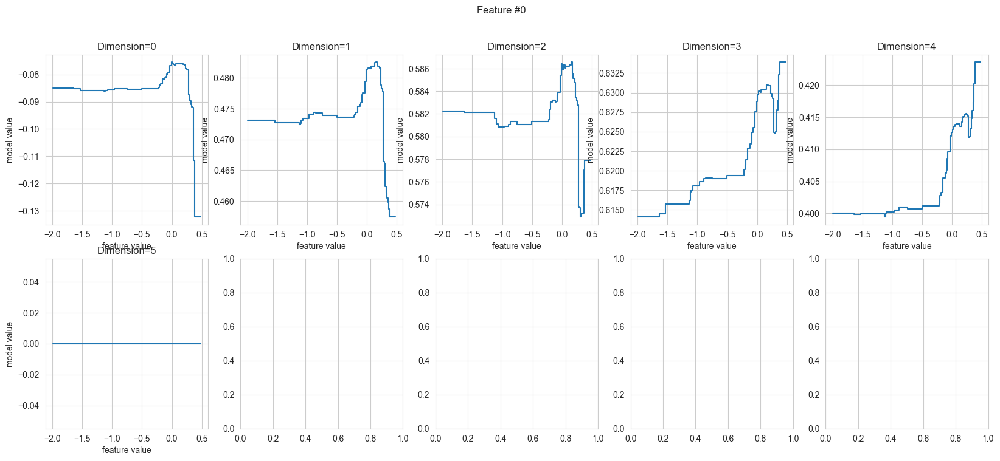

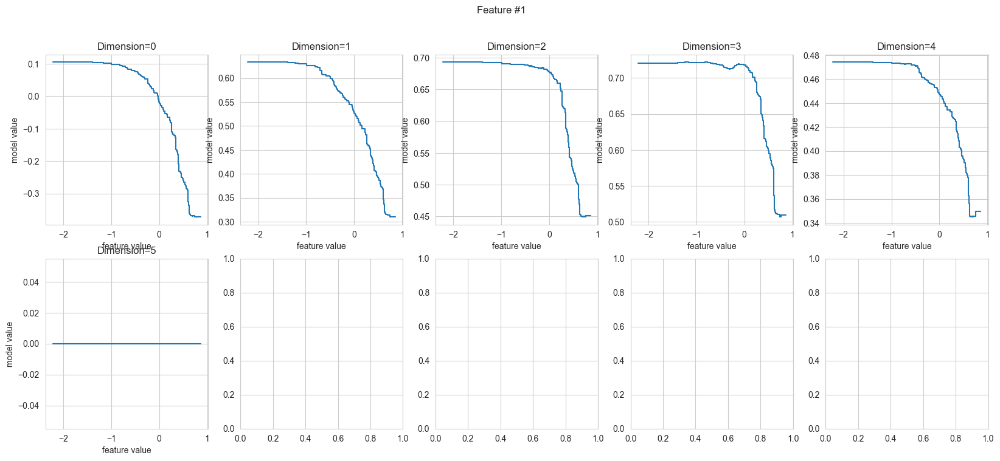

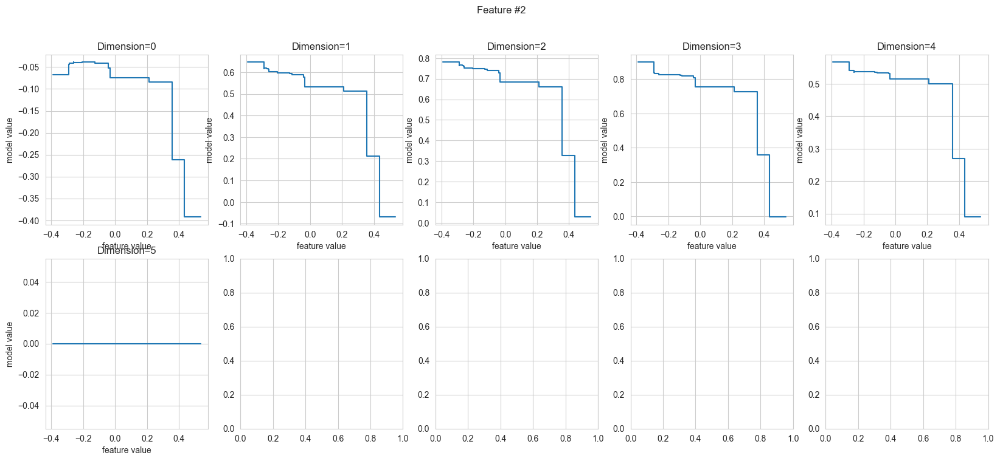

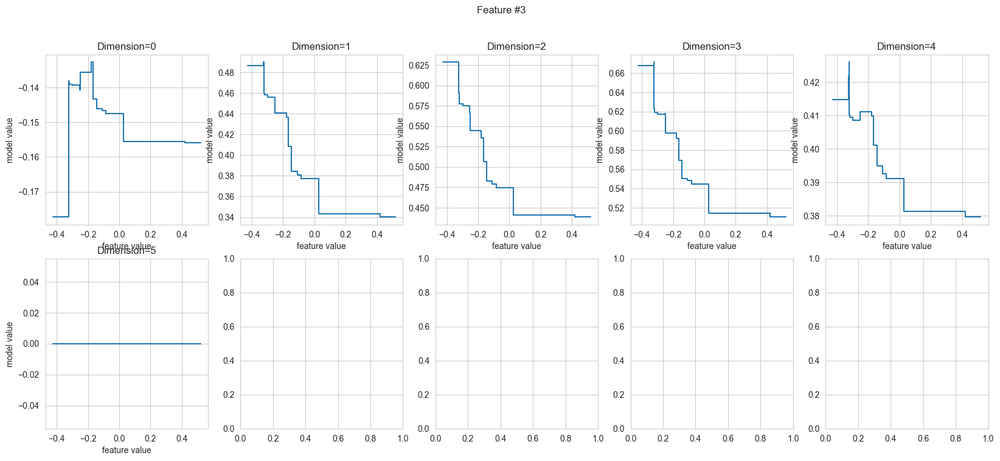

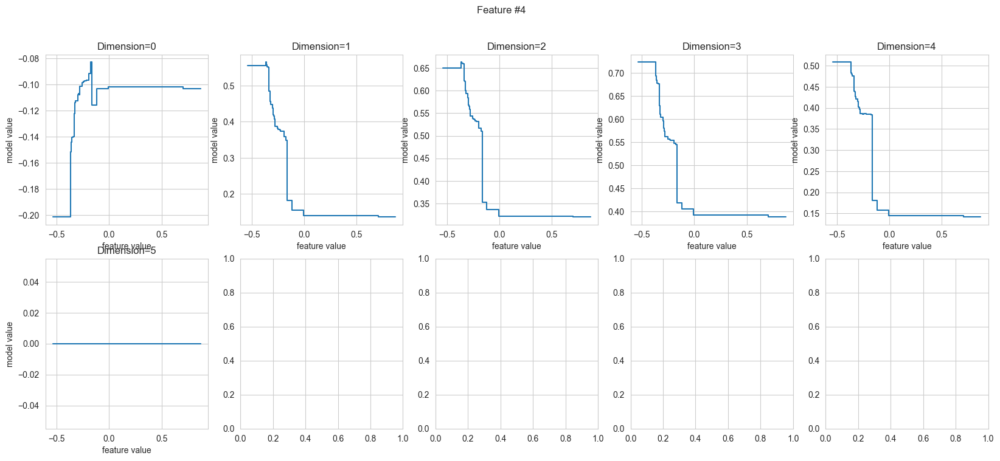

...

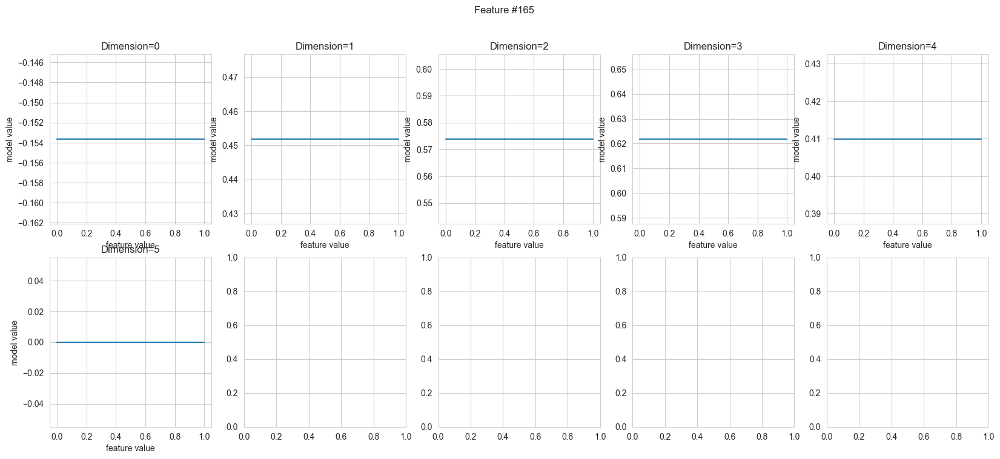

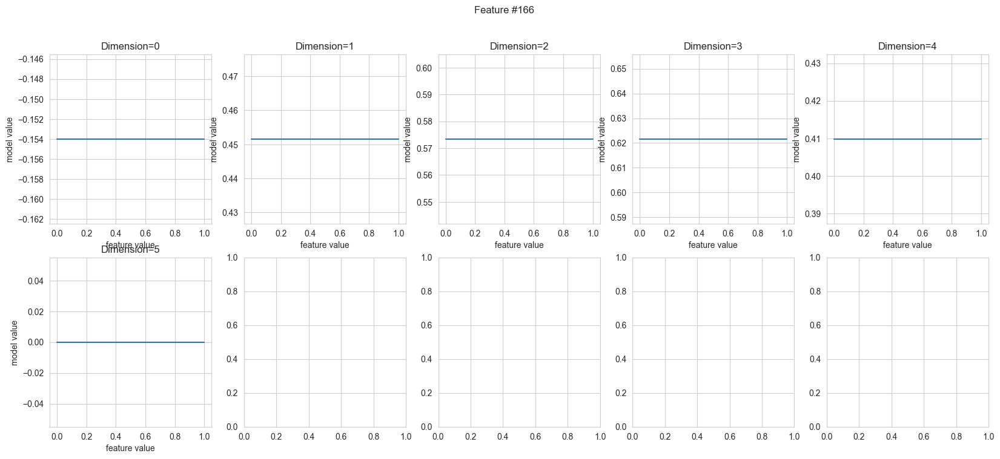

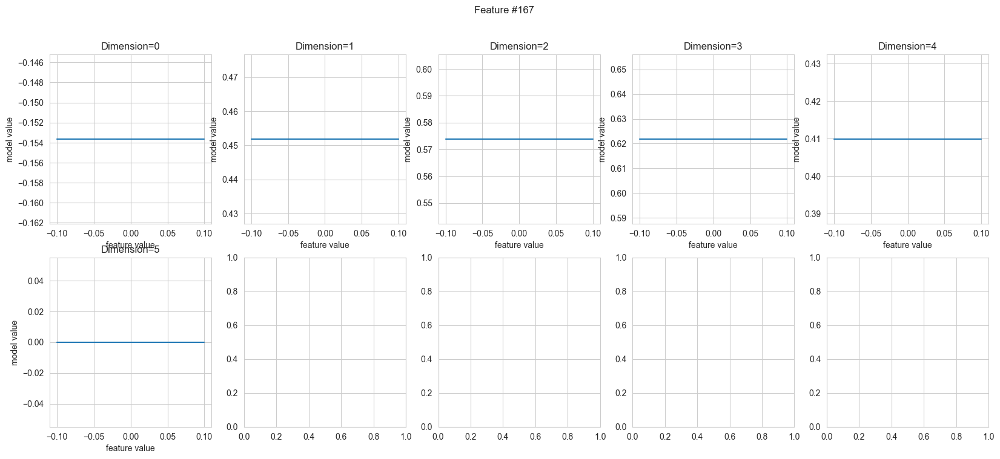

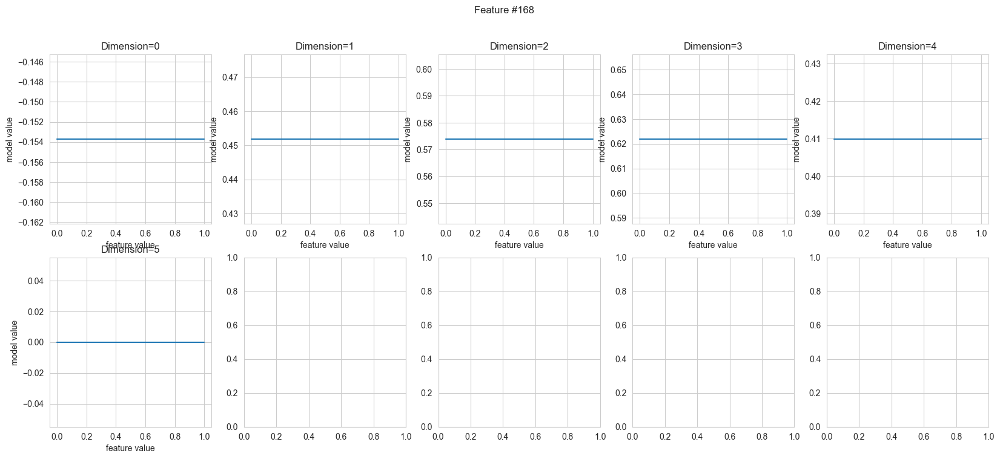

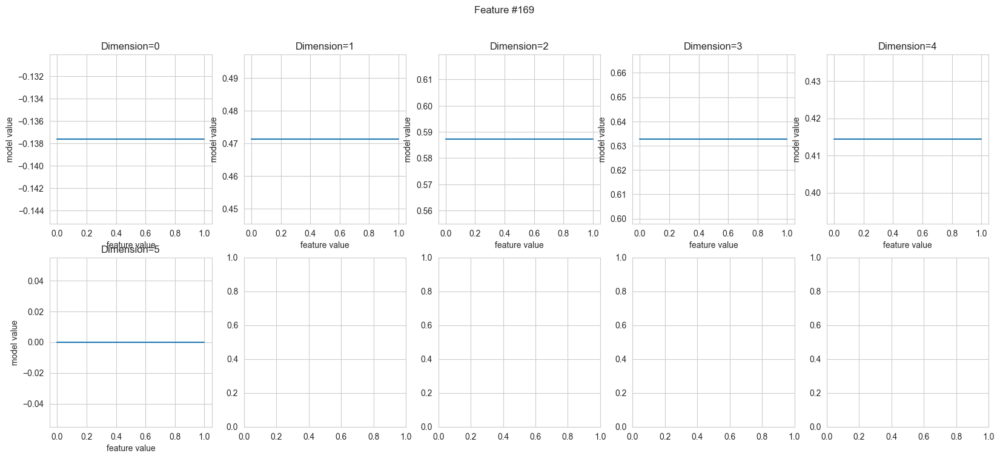

In [9]:
monoforest.to_polynom(cat)
X = monoforest.plot_pdp(cat, size_per_plot=(4,4))

In [ ]:
X = monoforest.plot_features_strength(cat, height_per_feature=0.3, width_per_plot=10)

In [107]:
feature_names = cat.feature_names_
print(feature_names[18])  # 获取第18个特征的名称


number_of_reviews_ltm


In [ ]:
df_train['number_of_review_ltm'].unique()